# K-means Clustering
* k-mean clustering is a type of unsupervised learning algorithm.
* It works on unlabeled data.
* It make clusters from unlabeled data.

c:\Users\Zone Tech\.conda\envs\ai_ml\Lib\site-packages\sklearn\cluster\_kmeans.py:1428: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


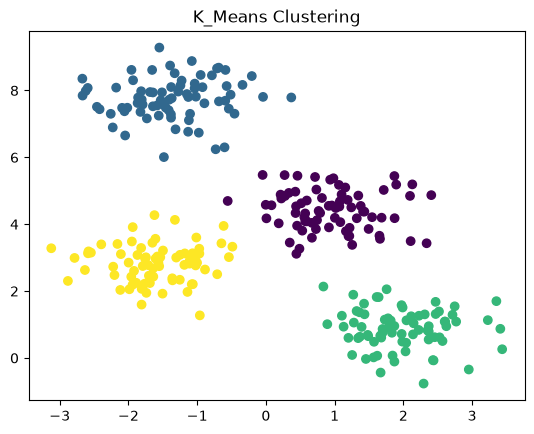

In [1]:
# import libraries
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt

# generate the simple data
X, y_true = make_blobs(n_samples=300, centers=4, cluster_std=0.6, random_state=0)

# initialize a KMeans object with the number of clusters
kmeans = KMeans(n_clusters=4)
# fit the data to the  KMeans algorithms 
kmeans.fit(X)

# get the predicted cluster label for each data point
labels = kmeans.labels_

# plot the data points with different colors for different clusters
plt.scatter(X[:, 0], X[:, 1], c=labels)
plt.title("K_Means Clustering")
plt.show()




# Letis practice on diamonds dataset

In [4]:
df = sns.load_dataset('diamonds')
df.isnull().sum()

carat      0
cut        0
color      0
clarity    0
depth      0
table      0
price      1
x          1
y          1
z          1
dtype: int64

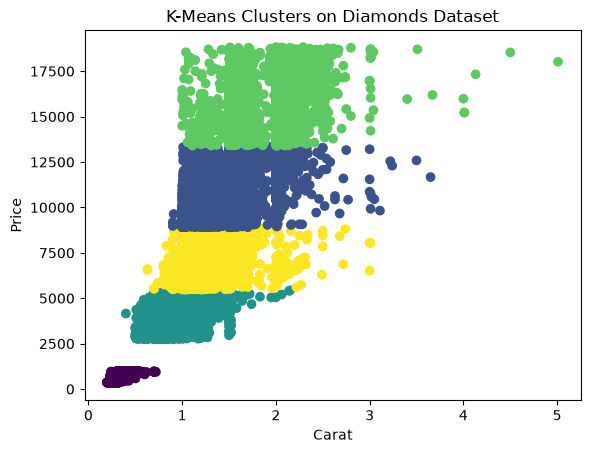

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.cluster import KMeans

df = sns.load_dataset('diamonds')

# impute the missing values in the price column because the price columns have one missing values 
df['price'] = df['price'].fillna(df['price'].median())

# select the relevant columns
X = df[['carat', 'price']]

kmeans = KMeans(n_clusters=5)
kmeans.fit(X)

# Get the predicted cluster labels for each data point
labels = kmeans.labels_

# Add predicted cluster labels for each data point
df['labels']=labels

# plot the data points with different colors for different clusters
plt.scatter(X.iloc[:,0], X.iloc[:, 1], c=labels)
plt.xlabel("Carat")
plt.ylabel("Price")
plt.title("K-Means Clusters on Diamonds Dataset")
plt.show()

In [3]:
df.head()

,carat,cut,color,clarity,depth,table,price,x,y,z,labels
0,0.23,Ideal,E,SI2,61.5,55.0,326.0,3.95,3.98,2.43,0
1,0.21,Premium,E,SI1,59.8,61.0,326.0,3.89,3.84,2.31,0
2,0.23,Good,E,VS1,56.9,65.0,327.0,4.05,4.07,2.31,0
3,0.29,Premium,I,VS2,62.4,58.0,334.0,4.20,4.23,2.63,0
4,0.31,Good,J,SI2,63.3,58.0,335.0,4.34,4.35,2.75,0


<Axes: xlabel='labels', ylabel='price'>

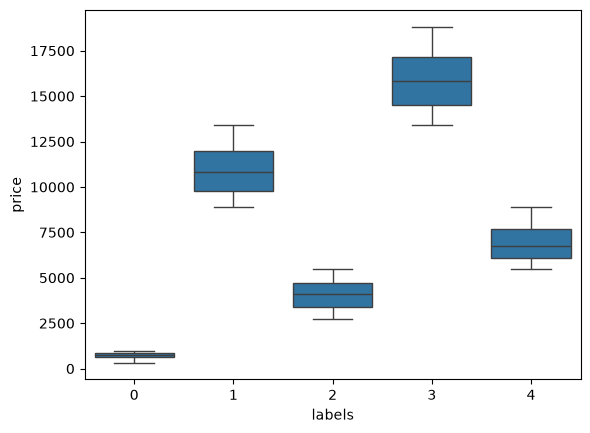

In [4]:
sns.boxplot(x="labels", y='price', data=df)

In [5]:
df.labels.unique()

array([0, 2, 4, 1, 3])

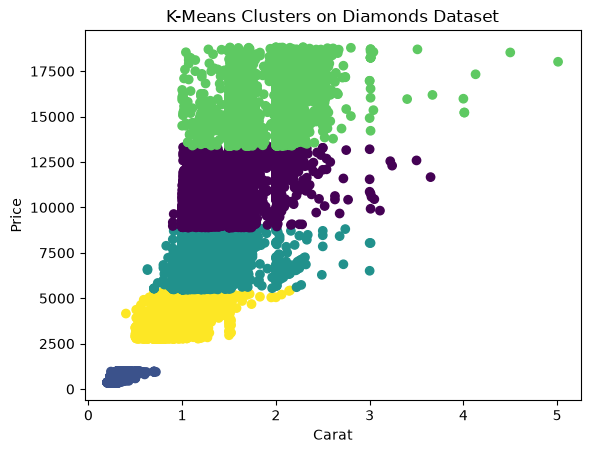

In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.cluster import KMeans

df = sns.load_dataset('diamonds')

# impute the missing values in the price column because the price columns have one missing values 
df['price'] = df['price'].fillna(df['price'].median())

# select the relevant columns
X = df[['carat', 'price', 'cut', 'color', 'clarity']]

# Convert the categorical variables into numerical 
X = pd.get_dummies(X)

kmeans = KMeans(n_clusters=5)
kmeans.fit(X)

# Get the predicted cluster labels for each data point
labels = kmeans.labels_

# Add predicted cluster labels for each data point
df['labels']=labels

# plot the data points with different colors for different clusters
plt.scatter(X.iloc[:,0], X.iloc[:, 1], c=labels)
plt.xlabel("Carat")
plt.ylabel("Price")
plt.title("K-Means Clusters on Diamonds Dataset")
plt.show()

# Can we plot the Categorical data? with numerical ?

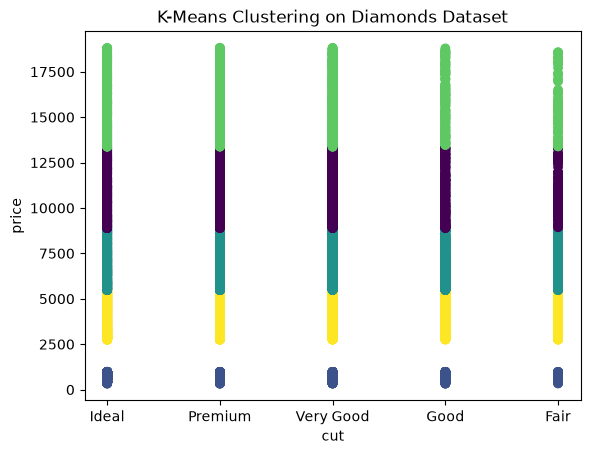

In [8]:
# plot the data points with different colors for different clusters
cut_cat = df['cut'].astype('category')
plt.scatter(cut_cat.cat.codes, df['price'], c=labels)
plt.xticks(range(len(cut_cat.cat.categories)), cut_cat.cat.categories)
plt.xlabel('cut')
plt.ylabel('price')
plt.title("K-Means Clustering on Diamonds Dataset")
plt.show()


# Adding cluster labels to the data for further EDA work

In [9]:
# select the relevant columns
X = df[['carat', 'price']]

# Instantiate a KMeans object with the number of clusters
kmeans = KMeans(n_clusters=3)

# fit the data to the kmeans algorithm
kmeans.fit(X)

# Get the predicted cluster labels for each data cluster
labels = kmeans.predict(X)

# Add predicted cluster labels as a new columns to the original dataset
df['labels'] = labels

# Display the first few rows of the  dataset with the new column added
print(df.head())

# Display the  unique values of a label
print("These are  the unique values of labels:", sorted(df.labels.unique()))



   carat      cut color clarity  depth  table  price     x     y     z  labels
0   0.23    Ideal     E     SI2   61.5   55.0  326.0  3.95  3.98  2.43       0
1   0.21  Premium     E     SI1   59.8   61.0  326.0  3.89  3.84  2.31       0
2   0.23     Good     E     VS1   56.9   65.0  327.0  4.05  4.07  2.31       0
3   0.29  Premium     I     VS2   62.4   58.0  334.0  4.20  4.23  2.63       0
4   0.31     Good     J     SI2   63.3   58.0  335.0  4.34  4.35  2.75       0
These are  the unique values of labels: [0, 1, 2]


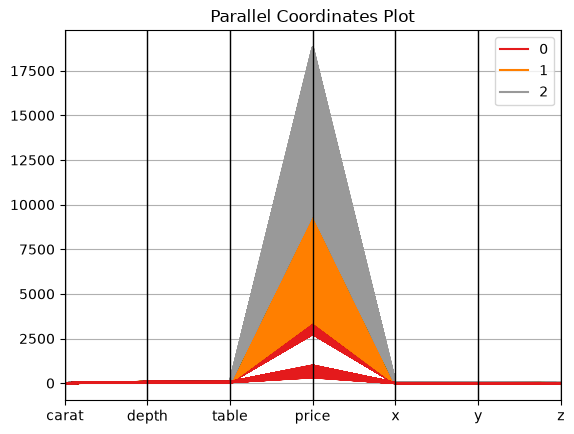

In [10]:
from pandas.plotting import parallel_coordinates
import matplotlib.pyplot as plt

# use only numeric columns + labels and drop rows with missing numeric values
df_num = df.select_dtypes(include=['number']).copy()
df_num['labels'] = df['labels'].astype(str)  # parallel_coordinates expects categorical/class labels
df_num = df_num.dropna()

parallel_coordinates(df_num, 'labels', colormap=plt.cm.Set1)

plt.title("Parallel Coordinates Plot")
plt.show()

In [11]:
import plotly.express as px

# Select only numeric columns
df_num = df.select_dtypes(include=['number']).copy()

# Create Parallel Coordinates Plot
fig = px.parallel_coordinates(
    df_num,
    color='labels',                     # Colour based on cluster labels
    labels={
        'carat': 'Carat',
        'price': 'Price',
        'depth': 'Depth',
        'table': 'Table',
        'x': 'Length',
        'y': 'Width',
        'z': 'Height',
        'labels': 'Cluster'
    },
    color_continuous_scale=px.colors.diverging.Tealrose
)

fig.update_layout(
    title="Parallel Coordinates Plot of K-Means Clusters"
)

fig.show()

In [12]:
import plotly.express as px

df_plot = df[['carat', 'price', 'labels']]

fig = px.parallel_coordinates(
    df_plot,
    color='labels',
    color_continuous_scale=px.colors.sequential.Viridis
)

fig.update_layout(
    title="Parallel Coordinates Plot"
)

fig.show()

In [13]:
df.head()

,carat,cut,color,clarity,depth,table,price,x,y,z,labels
0,0.23,Ideal,E,SI2,61.5,55.0,326.0,3.95,3.98,2.43,0
1,0.21,Premium,E,SI1,59.8,61.0,326.0,3.89,3.84,2.31,0
2,0.23,Good,E,VS1,56.9,65.0,327.0,4.05,4.07,2.31,0
3,0.29,Premium,I,VS2,62.4,58.0,334.0,4.20,4.23,2.63,0
4,0.31,Good,J,SI2,63.3,58.0,335.0,4.34,4.35,2.75,0


# Model Evaluation
1. Elbow Method

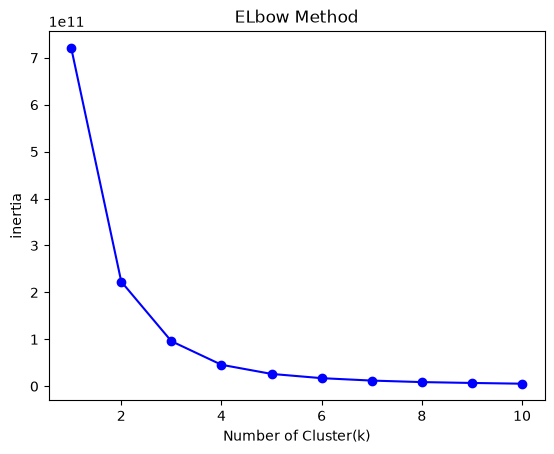

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.cluster import KMeansS

df = sns.load_dataset('diamonds')

# impute the missing values in the price column because the price columns have one missing values 
df['price'] = df['price'].fillna(df['price'].median())

# select the relevant features columns for clustering
features = df[['carat', 'depth', 'price']]

# Extract the selected features from the dataset
X = features.copy()

# Performe k-means clustering for different values of k
k_values = range(1, 11) # test k from 1 to 10
inertias = []  # list to store the inertia values

for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    inertias.append(kmeans.inertia_)

# plot the Elbow curve

plt.plot(k_values, inertias, 'bo-')
plt.xlabel('Number of Cluster(k)')
plt.ylabel('inertia')
plt.title('ELbow Method')
plt.show()

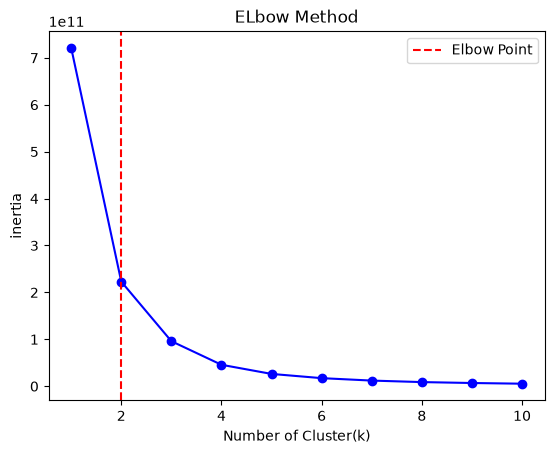

The best elbow point is =  2


In [15]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.cluster import KMeans

df = sns.load_dataset('diamonds')

# impute the missing values in the price column because the price columns have one missing values 
df['price'] = df['price'].fillna(df['price'].median())

# select the relevant features columns for clustering
features = df[['carat', 'depth', 'price']]

# Extract the selected features from the dataset
X = features.copy()

# Performe k-means clustering for different values of k
k_values = range(1, 11) # test k from 1 to 10
inertias = []  # list to store the inertia values

for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    inertias.append(kmeans.inertia_)

# plot the Elbow curve
plt.plot(k_values, inertias, 'bo-')
plt.xlabel('Number of Cluster(k)')
plt.ylabel('inertia')
plt.title('ELbow Method')

# find the elbow point 
diff = [inertias[i] - inertias[i+1] for i in range(len(inertias)-1)]
best_k = diff.index(max(diff)) + 2

# Add s vertical line to indicates the cluster
plt.axvline(x=best_k, color='r', linestyle='--', label='Elbow Point')

plt.legend()
plt.show()
print('The best elbow point is = ',best_k)


In [ ]:
from kneed import KneeLocator

knee = KneeLocator(
    k_values,
    inertias,
    curve='convex',
    direction='decreasing'
)

best_k = knee.elbow

plt.plot(k_values, inertias, 'bo-')
plt.axvline(best_k, color='red', linestyle='--', label=f'Best K = {best_k}')
plt.legend()
plt.show()

print("Best K =", best_k)

# 2. Silouette Method

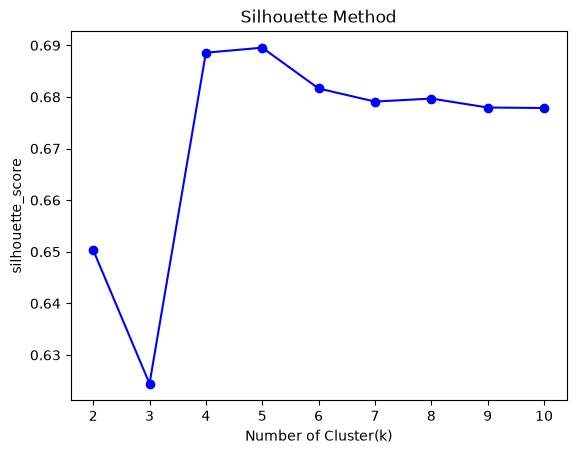

In [16]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

df = sns.load_dataset('diamonds')

# impute the missing values in the price column because the price columns have one missing values 
df['price'] = df['price'].fillna(df['price'].median())

# select the relevant features columns for clustering
features = df[['carat', 'depth', 'price']]

# Extract the selected features from the dataset
X = features.copy()

# Performe k-means clustering for different values of k
k_values = range(2, 11) # test k from 1 to 10
silhouette_scores = []  # list to store the silhouette_score

for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    labels = kmeans.labels_
    silhouette_scores.append(silhouette_score(X, labels))

# plot the silhouette_score
plt.plot(k_values, silhouette_scores, 'bo-')
plt.xlabel('Number of Cluster(k)')
plt.ylabel('silhouette_score')
plt.title('Silhouette Method')
plt.show()


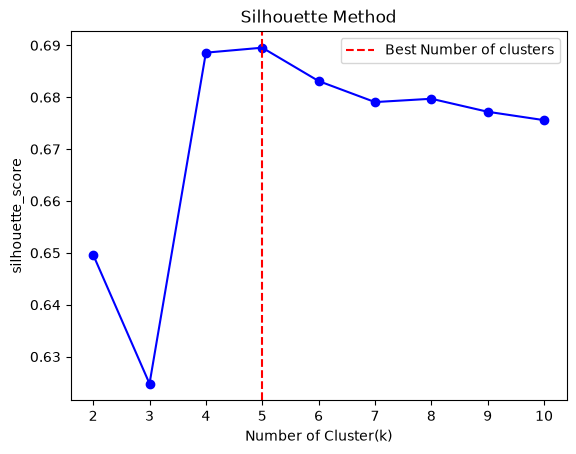

The best number of cluster based on the silhouette Method is =  5


In [18]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

df = sns.load_dataset('diamonds')

# impute the missing values in the price column because the price columns have one missing values 
df['price'] = df['price'].fillna(df['price'].median())

# select the relevant features columns for clustering
features = df[['carat', 'depth', 'price']]

# Extract the selected features from the dataset
X = features.copy()

# Performe k-means clustering for different values of k
k_values = range(2, 11) # test k from 1 to 10
silhouette_scores = []  # list to store the silhouette_score

for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    labels = kmeans.labels_
    silhouette_scores.append(silhouette_score(X, labels))

# plot the silhouette_score
plt.plot(k_values, silhouette_scores, 'bo-')
plt.xlabel('Number of Cluster(k)')
plt.ylabel('silhouette_score')
plt.title('Silhouette Method')

# find the best number of cluster based on the silhouette method
best_k = k_values[silhouette_scores.index(max(silhouette_scores))]

# Add s vertical line to indicates the cluster
plt.axvline(x=best_k, color='r', linestyle='--', label='Best Number of clusters')

plt.legend()
plt.show()
print('The best number of cluster based on the silhouette Method is = ',best_k)


# Other Evaluation Methods
1. Calinski_Harbasz
2. Davies- bouldin
3. Silhouette
4. Gap statistic
5. Bayesian information criterion (BIC)

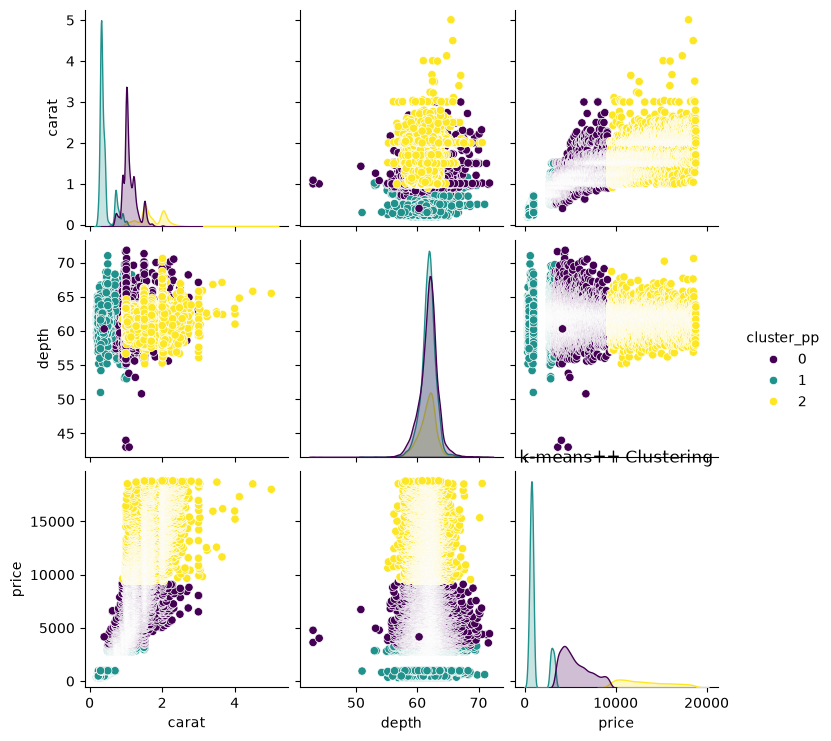

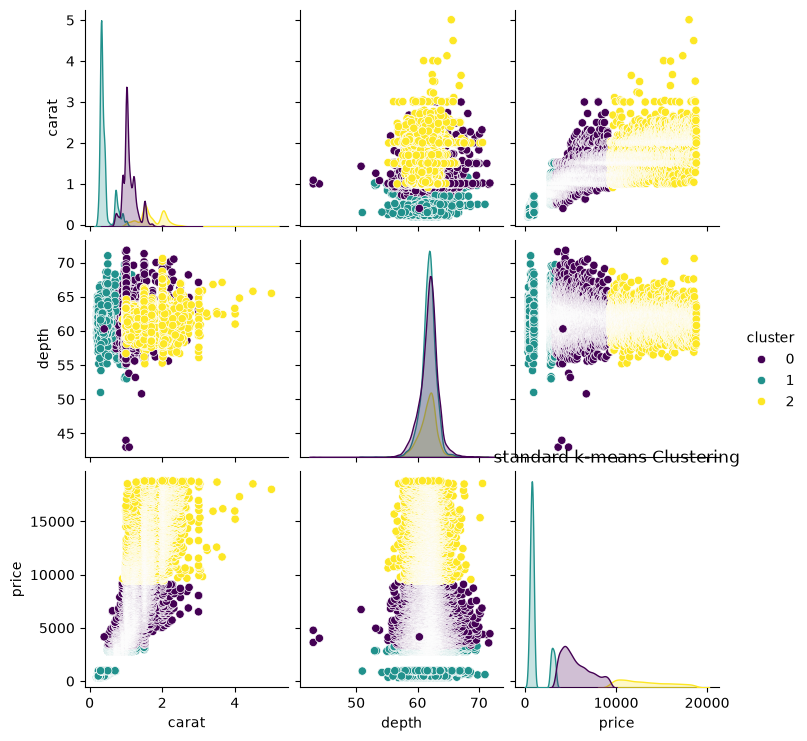

In [36]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.cluster import KMeans

df = sns.load_dataset('diamonds')

# impute the missing values in the price column because the price columns have one missing values 
df['price'] = df['price'].fillna(df['price'].median())

# select the relevant features columns for clustering
features = df[['carat', 'depth', 'price']]

# Extract the selected features from the dataset
X = features.copy()

# Performe k-means clustering wiht k-means++
k=3 # number of cluster
kmeans_pp = KMeans(n_clusters=k, init='k-means++', random_state=42)
kmeans_pp.fit(X)

# perform standard k_means clustering
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(X)

# Add the cluster labels to the dataset
df['cluster_pp'] = kmeans_pp.labels_
df['cluster'] = kmeans.labels_
df.head()

# visualize the cluster with k_means++
sns.pairplot(df, vars=features, hue="cluster_pp", palette='viridis')
plt.title('k-means++ Clustering')
plt.show()

# visualize the cluster with k_means++
sns.pairplot(df, vars=features, hue="cluster", palette='viridis')
plt.title('standard k-means Clustering')
plt.show()

In [22]:
df.cluster.value_counts()


cluster
0    16087
1    15408
2     5830
Name: count, dtype: int64

In [23]:
df.cluster_pp.value_counts()

cluster_pp
0    16087
1    15408
2     5830
Name: count, dtype: int64

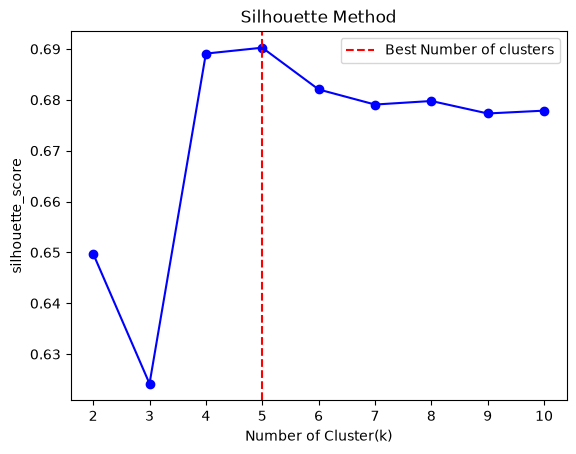

The best number of cluster based on the silhouette Method is =  5


In [24]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

df = sns.load_dataset('diamonds')

# impute the missing values in the price column because the price columns have one missing values 
df['price'] = df['price'].fillna(df['price'].median())

# select the relevant features columns for clustering
features = df[['carat', 'depth', 'price']]

# Extract the selected features from the dataset
X = features.copy()

# Performe k-means clustering for different values of k
k_values = range(2, 11) # test k from 1 to 10
silhouette_scores = []  # list to store the silhouette_score

for k in k_values:
    kmeans = KMeans(n_clusters=k, init='k-means++')
    kmeans.fit(X)
    labels = kmeans.labels_
    silhouette_scores.append(silhouette_score(X, labels))

# plot the silhouette_score
plt.plot(k_values, silhouette_scores, 'bo-')
plt.xlabel('Number of Cluster(k)')
plt.ylabel('silhouette_score')
plt.title('Silhouette Method')

# find the best number of cluster based on the silhouette method
best_k = k_values[silhouette_scores.index(max(silhouette_scores))]

# Add s vertical line to indicates the cluster
plt.axvline(x=best_k, color='r', linestyle='--', label='Best Number of clusters')

plt.legend()
plt.show()
print('The best number of cluster based on the silhouette Method is = ',best_k)


In [ ]:
# let's used plotly and make plots
import plotly.express as px

# 2D interactive scatter
# Make sure the cluster labels exist in the dataframe before plotting
if 'cluster_pp' not in df.columns:
    df['cluster_pp'] = kmeans_pp.labels_

fig = px.scatter(df, x='carat', y='price', color='cluster_pp', title='Carat vs Price by cluster_pp')
fig.show()


In [31]:
# 3D interactive scatter
fig3 = px.scatter_3d(df, x='carat', y='depth', z='price', color='cluster_pp', title='3D: Carat, Depth, Price by cluster_pp')
fig3.show()

In [34]:
fig = px.parallel_coordinates(df, color='cluster_pp')
fig.show()